# Project team's ID : " PTID-CDS-FEB-24-1839 "

# PRCP-1009-CellphonePrice

# Statement

## Business Case Scenario
Bob has started his own mobile company and intends to challenge major competitors. However, he lacks the expertise to estimate the prices of the mobile devices his company manufactures. Recognizing the complexity of the competitive mobile phone market, assumptions won't suffice. To address this challenge, he gathers sales data from various mobile phone companies.

Bob aims to discern the relationship between a mobile phone's features (e.g., RAM, internal memory, etc.) and its selling price. Unfortunately, he lacks proficiency in machine learning and seeks your assistance to overcome this obstacle.

In this problem, the goal is not to predict the exact price but to determine a price range that indicates the relative cost of the mobile phone.

## Project Overview:
Objective: Develop a machine learning model for predicting the price range of cell phones based on various features.

Task: Perform multiclassification to categorize cell phones into different price ranges

## Problem Statement
In the competitive mobile phone market, companies want to understand sales data of mobile phones and factors which drive the prices. The objective is to find out some relation between features of a mobile phone(eg:- RAM, Internal Memory, etc) and its selling price. In this problem, we do not have to predict the actual price but a price range indicating how high the price is.

Task 1:-Prepare a complete data analysis report on the given data.

Task 2:-On the basis of the mobile Specification like Battery power, 3G enabled ,
wifi ,Bluetooth, Ram etc predict the Price range of the mobile.

Task 3:- Prepare the analysis report stating how model will help expanding the
business by stating several factors including feature importance.



# Data fields

● battery_power - Total energy a battery can store in one time measured in mAh
● blue - Has bluetooth or not
● clock_speed - speed at which microprocessor executes instructions
● dual_sim - Has dual sim support or not
● fc - Front Camera mega pixels
● four_g - Has 4G or not
● int_memory - Internal Memory in Gigabytes
● m_dep - Mobile Depth in cm
● mobile_wt - Weight of mobile phone
● n_cores - Number of cores of processor
● pc - Primary Camera mega pixels
● px_height - Pixel Resolution Height
● px_width - Pixel Resolution Width
● ram - Random Access Memory in Megabytes
● sc_h - Screen Height of mobile in cm
● sc_w - Screen Width of mobile in cm
● talk_time - longest time that a single battery charge will last when you are
● three_g - Has 3G or not
● touch_screen - Has touch screen or not
● wifi - Has wifi or not
● price_range - This is the target variable with value of 0(low cost), 1(medium cost), 2(high
cost) and 3(very high cost).

## Import Basic Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

## Load Dataset

In [2]:
# Loading the data from csv file
data = pd.read_csv('datasets_11167_15520_train.csv')

In [3]:
# Reading the data
data

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208,1212,1411,8,2,15,1,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,794,1,0.5,1,0,1,2,0.8,106,6,...,1222,1890,668,13,4,19,1,1,0,0
1996,1965,1,2.6,1,0,0,39,0.2,187,4,...,915,1965,2032,11,10,16,1,1,1,2
1997,1911,0,0.9,1,1,1,36,0.7,108,8,...,868,1632,3057,9,1,5,1,1,0,3
1998,1512,0,0.9,0,4,1,46,0.1,145,5,...,336,670,869,18,10,19,1,1,1,0


## Basic Checks

In [4]:
# Dataset of Five Rows (by default it will be 5 rows only)
data.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208,1212,1411,8,2,15,1,1,0,1


In [5]:
# Data of last 5 rows (by default it will be 5 rows only)
data.tail()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
1995,794,1,0.5,1,0,1,2,0.8,106,6,...,1222,1890,668,13,4,19,1,1,0,0
1996,1965,1,2.6,1,0,0,39,0.2,187,4,...,915,1965,2032,11,10,16,1,1,1,2
1997,1911,0,0.9,1,1,1,36,0.7,108,8,...,868,1632,3057,9,1,5,1,1,0,3
1998,1512,0,0.9,0,4,1,46,0.1,145,5,...,336,670,869,18,10,19,1,1,1,0
1999,510,1,2.0,1,5,1,45,0.9,168,6,...,483,754,3919,19,4,2,1,1,1,3


In [6]:
# Fetching all columns
data.columns

Index(['battery_power', 'blue', 'clock_speed', 'dual_sim', 'fc', 'four_g',
       'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc', 'px_height',
       'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time', 'three_g',
       'touch_screen', 'wifi', 'price_range'],
      dtype='object')

In [7]:
# Informations of data
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   battery_power  2000 non-null   int64  
 1   blue           2000 non-null   int64  
 2   clock_speed    2000 non-null   float64
 3   dual_sim       2000 non-null   int64  
 4   fc             2000 non-null   int64  
 5   four_g         2000 non-null   int64  
 6   int_memory     2000 non-null   int64  
 7   m_dep          2000 non-null   float64
 8   mobile_wt      2000 non-null   int64  
 9   n_cores        2000 non-null   int64  
 10  pc             2000 non-null   int64  
 11  px_height      2000 non-null   int64  
 12  px_width       2000 non-null   int64  
 13  ram            2000 non-null   int64  
 14  sc_h           2000 non-null   int64  
 15  sc_w           2000 non-null   int64  
 16  talk_time      2000 non-null   int64  
 17  three_g        2000 non-null   int64  
 18  touch_sc

In [8]:
# Summary Statistics for Numerical Feature
data.describe().T

,count,mean,std,min,25%,50%,75%,max
battery_power,2000.0,1238.51850,439.418206,501.0,851.75,1226.0,1615.25,1998.0
blue,2000.0,0.49500,0.500100,0.0,0.00,0.0,1.00,1.0
clock_speed,2000.0,1.52225,0.816004,0.5,0.70,1.5,2.20,3.0
dual_sim,2000.0,0.50950,0.500035,0.0,0.00,1.0,1.00,1.0
fc,2000.0,4.30950,4.341444,0.0,1.00,3.0,7.00,19.0
four_g,2000.0,0.52150,0.499662,0.0,0.00,1.0,1.00,1.0
int_memory,2000.0,32.04650,18.145715,2.0,16.00,32.0,48.00,64.0
m_dep,2000.0,0.50175,0.288416,0.1,0.20,0.5,0.80,1.0
mobile_wt,2000.0,140.24900,35.399655,80.0,109.00,141.0,170.00,200.0
n_cores,2000.0,4.52050,2.287837,1.0,3.00,4.0,7.00,8.0


In [9]:
# Findinf the size of the dataset
data.shape

(2000, 21)

In [10]:
data.value_counts()

battery_power  blue  clock_speed  dual_sim  fc  four_g  int_memory  m_dep  mobile_wt  n_cores  pc  px_height  px_width  ram   sc_h  sc_w  talk_time  three_g  touch_screen  wifi  price_range
501            0     2.3          0         12  1       54          0.3    131        4        19  504        1089      2346  13    12    2          1        0             1     1              1
1494           0     1.9          0         2   1       47          0.4    129        2        9   207        1177      3202  13    1     14         1        0             0     3              1
1504           0     1.9          1         7   1       25          0.3    152        4        9   395        1853      1788  13    11    13         1        0             1     1              1
                     1.5          0         12  1       34          0.7    142        8        15  507        973       2806  7     2     7          1        0             1     2              1
1503           1     0.7      

In [11]:
# Finding the different types of the data
data.dtypes

battery_power      int64
blue               int64
clock_speed      float64
dual_sim           int64
fc                 int64
four_g             int64
int_memory         int64
m_dep            float64
mobile_wt          int64
n_cores            int64
pc                 int64
px_height          int64
px_width           int64
ram                int64
sc_h               int64
sc_w               int64
talk_time          int64
three_g            int64
touch_screen       int64
wifi               int64
price_range        int64
dtype: object

# EDA
 Exploratory Data Analysis(EDA) is a crucial step in understanding and summarizing the main characteristics of a dataset.

### Univariate:



 Histplot, Distplot----> Continues data

Count plot----> Discrete and categorical data

Examine the distribution of each individual feature.
Plot histograms, density plots, box plots, or bar plots to visualize distributions and identify outliers.

In [12]:
! pip install ydata_profiling

The ydata_profiling library, also known as pandas-profiling, is a powerful tool for generating exploratory data analysis (EDA) reports in Python. It automates the process of generating descriptive statistics, visualizations, and insights about the structure and characteristics of a dataset. Here's a proper description of ProfileReport from ydata_profiling:

### Description:

ProfileReport is a class provided by the ydata_profiling library that enables the generation of comprehensive and interactive EDA reports for Pandas DataFrames. This tool facilitates data exploration by automatically computing and visualizing various statistics and insights about the dataset. The generated report includes information on the data types, summary statistics, distribution of variables, correlation analysis, missing values, and more.


### Key Features:

Automatic Report Generation: ProfileReport generates a detailed EDA report automatically with minimal code, saving time and effort in manual exploration.

Comprehensive Insights: The report provides comprehensive insights into the dataset, including descriptive statistics, histograms, scatter plots, correlation matrices, and more, allowing users to gain a deeper understanding of the data.

Interactive Visualizations: The generated report includes interactive visualizations that enable users to explore the data dynamically, zoom in on specific areas of interest, and customize the visualization settings for better analysis.

Customizable Configuration: Users can customize the profiling process by specifying configuration options such as variable types, correlation methods, and plot types to tailor the report according to their specific requirements.

Export Options: ProfileReport supports exporting the generated report in various formats, including HTML, JSON, and interactive widgets, making it easy to share and integrate the findings into presentations or documentation.

In [13]:
from ydata_profiling import ProfileReport

In [14]:
pf=ProfileReport

In [15]:
# Generating the profile report
pf(data)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Overall, ProfileReport from ydata_profiling simplifies the process of conducting EDA and facilitates insightful data exploration, making it a valuable tool for data scientists, analysts, and researchers working with Python and Pandas DataFrames.

### Bivariate:Scatter plot, Line plot

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-l

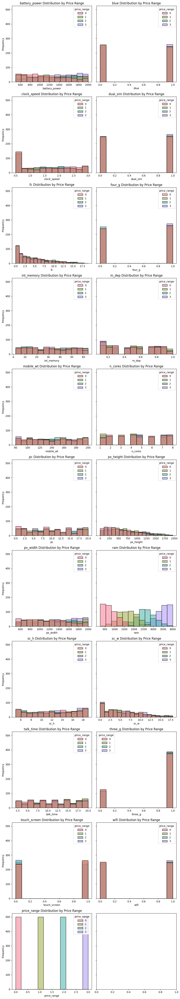

In [16]:
# Assuming 'data' is your DataFrame

# Define a custom color palette
palette = sns.color_palette("husl", n_colors=4)

# Get numeric columns
numeric_columns = data.select_dtypes(include=['number']).columns

# Calculate the number of subplots needed
num_subplots = len(numeric_columns)

# Determine the number of rows and columns for the subplot grid
num_rows = (num_subplots // 2) + (num_subplots % 2)
num_cols = 2

# Adjust the figure size for a square shape with more height
fig, axes = plt.subplots(num_rows, num_cols, figsize=(10, 5 * num_rows), sharey=True)

# Flatten the 2D array of subplots for easier indexing
axes = axes.flatten()

# Iterate through each numeric column for bivariate analysis
for i, column in enumerate(numeric_columns):
    # Determine the row and column indices
    row_index = i // num_cols
    col_index = i % num_cols

    # Histogram without KDE for 'price_range' and other columns
    sns.histplot(x=column, hue='price_range', data=data, ax=axes[i], common_norm=False, palette=palette)
    axes[i].set_title(f'{column} Distribution by Price Range')
    axes[i].set_xlabel(column)
    axes[i].set_ylabel('Frequency')

# Adjust layout
plt.tight_layout()
plt.show()

# Data Pre-processing

### 1. Find the Missing Values

In [17]:
# finding the null values count
data.isnull().sum()

battery_power    0
blue             0
clock_speed      0
dual_sim         0
fc               0
four_g           0
int_memory       0
m_dep            0
mobile_wt        0
n_cores          0
pc               0
px_height        0
px_width         0
ram              0
sc_h             0
sc_w             0
talk_time        0
three_g          0
touch_screen     0
wifi             0
price_range      0
dtype: int64

### 2. Checking Duplicates values

In [18]:
duplicate_row=data[data.duplicated()]
print(duplicate_row)

Empty DataFrame
Columns: [battery_power, blue, clock_speed, dual_sim, fc, four_g, int_memory, m_dep, mobile_wt, n_cores, pc, px_height, px_width, ram, sc_h, sc_w, talk_time, three_g, touch_screen, wifi, price_range]
Index: []

[0 rows x 21 columns]


## 3. Checking Outliers

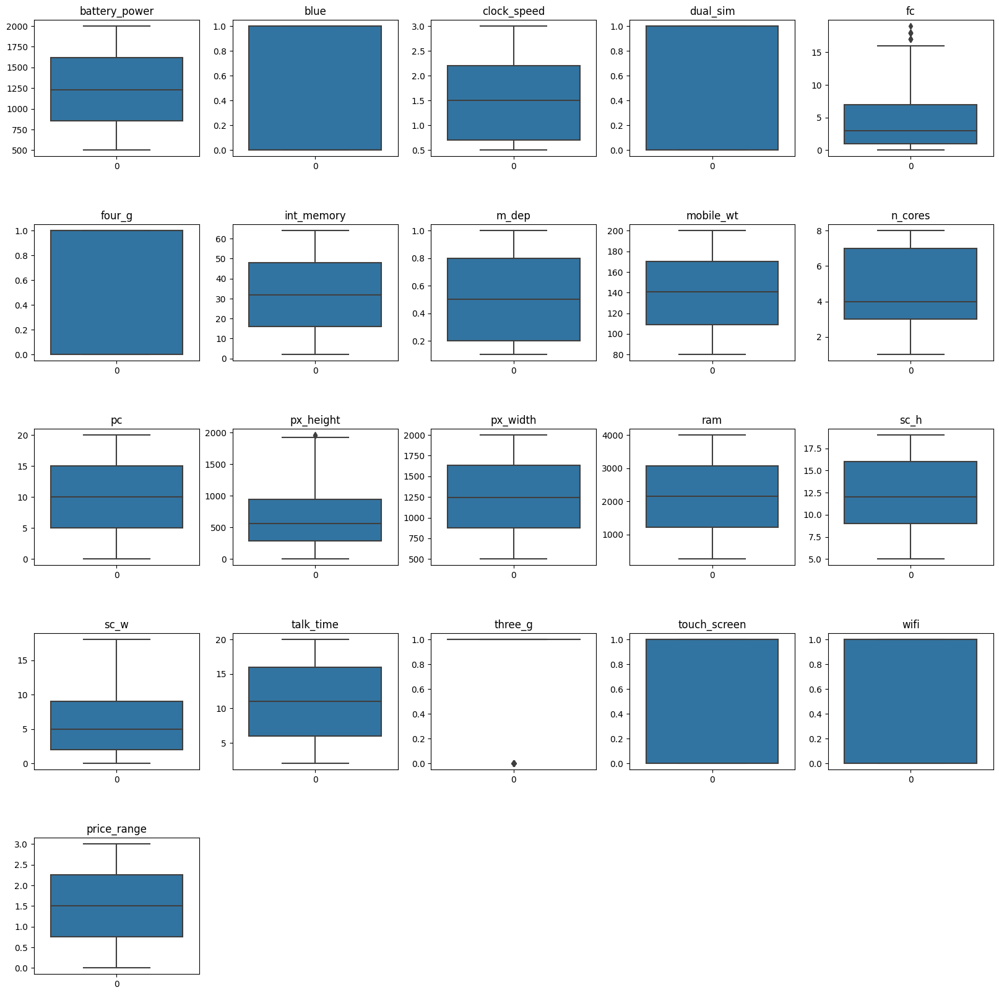

In [19]:
#Handling Outliers

# Set the figure size to 20x20
plt.figure(figsize=(20,20))

# Loop through each column in the DataFrame's describe() method
for index,item in enumerate([i for i in data.describe().columns.to_list()] ):

  # Create a subplot in a 5x5 grid, starting with the first subplot (index 0)
  plt.subplot(5,5,index+1)

  # Create a box plot of the current column's data
  sns.boxplot(data[item])

  # Add the column name to the subplot title
  plt.title(item)

  # Add some spacing between the subplots
  plt.subplots_adjust(hspace=0.5)

# Add a newline for clarity
print("\n")


## Observation

Their is no much outliers are present no need to do much experiment

### 4. Scaling(Only in countinues data)

In [20]:
from sklearn.preprocessing import MinMaxScaler

# Assuming 'data' is your DataFrame

# Separate 'price_range' column
price_range_column = data['price_range']
data_without_price_range = data.drop('price_range', axis=1)

# Initialize MinMaxScaler
scaler = MinMaxScaler()

# Fit and transform the data (excluding 'price_range') using Min-Max scaling
scaled_data_without_price_range = pd.DataFrame(scaler.fit_transform(data_without_price_range), columns=data_without_price_range.columns)

# Merge scaled data (excluding 'price_range') with 'price_range' column
data_scaled = pd.concat([scaled_data_without_price_range, price_range_column], axis=1)

# Display the first few rows of the scaled data
print(data_scaled.head())

   battery_power  blue  clock_speed  dual_sim        fc  four_g  int_memory  \
0       0.227789   0.0         0.68       0.0  0.052632     0.0    0.080645   
1       0.347361   1.0         0.00       1.0  0.000000     1.0    0.822581   
2       0.041416   1.0         0.00       1.0  0.105263     1.0    0.629032   
3       0.076152   1.0         0.80       0.0  0.000000     0.0    0.129032   
4       0.881764   1.0         0.28       0.0  0.684211     1.0    0.677419   

      m_dep  mobile_wt   n_cores  ...  px_height  px_width       ram  \
0  0.555556   0.900000  0.142857  ...   0.010204  0.170895  0.612774   
1  0.666667   0.466667  0.285714  ...   0.461735  0.993324  0.634687   
2  0.888889   0.541667  0.571429  ...   0.644388  0.811749  0.627205   
3  0.777778   0.425000  0.714286  ...   0.620408  0.858478  0.671566   
4  0.555556   0.508333  0.142857  ...   0.616327  0.475300  0.308658   

       sc_h      sc_w  talk_time  three_g  touch_screen  wifi  price_range  
0  0.285714  0.

### 5. Encoding

It is used for the catagorical data as we dont have any catagorical data it can be skiped.

# Feature Engineering

In [21]:
data.columns

Index(['battery_power', 'blue', 'clock_speed', 'dual_sim', 'fc', 'four_g',
       'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc', 'px_height',
       'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time', 'three_g',
       'touch_screen', 'wifi', 'price_range'],
      dtype='object')

### 1. Removing irrevelvant column

In [22]:
columns_to_drop = ['m_dep']
data = data.drop(columns=columns_to_drop)

In [23]:
data

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,188,2,2,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,136,3,6,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,145,5,6,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,131,6,9,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,141,2,14,1208,1212,1411,8,2,15,1,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,794,1,0.5,1,0,1,2,106,6,14,1222,1890,668,13,4,19,1,1,0,0
1996,1965,1,2.6,1,0,0,39,187,4,3,915,1965,2032,11,10,16,1,1,1,2
1997,1911,0,0.9,1,1,1,36,108,8,3,868,1632,3057,9,1,5,1,1,0,3
1998,1512,0,0.9,0,4,1,46,145,5,5,336,670,869,18,10,19,1,1,1,0


### 2. Checking Correlation

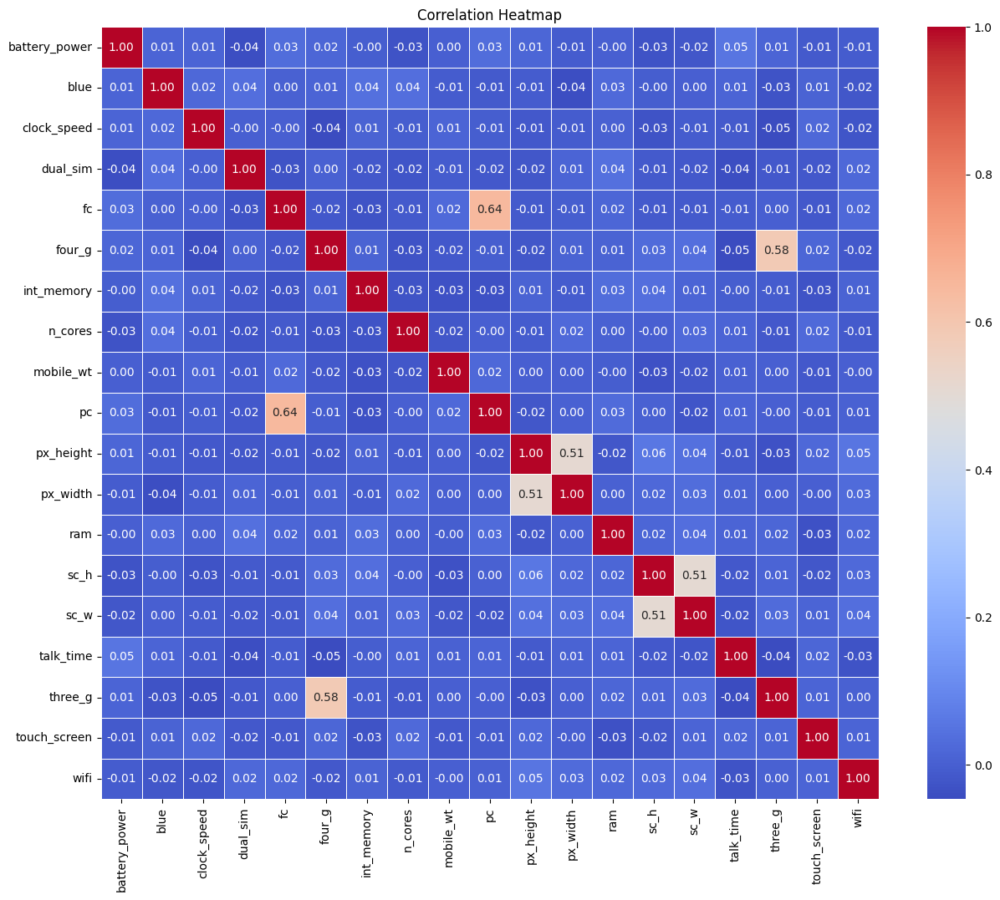

In [24]:
# Assuming 'data' is your DataFrame

# Select the columns for the heatmap
columns_for_heatmap = ['battery_power', 'blue', 'clock_speed', 'dual_sim', 'fc', 'four_g',
                       'int_memory','n_cores','mobile_wt', 'pc', 'px_height',
                       'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time', 'three_g',
                       'touch_screen', 'wifi']

# Create a correlation matrix
correlation_matrix = data[columns_for_heatmap].corr()

# Create a heatmap
plt.figure(figsize=(15, 12))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=.5)
plt.title('Correlation Heatmap')
plt.show()

### Conclusion
According to the heatmap, there are no high correlations between predictors

# Model Creation


### 1. Define X and Y and Split into Training an Testing

In [25]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report

# Assuming 'data_scaled' is your DataFrame after Min-Max scaling

# Split the data into features (X) and target variable (y)
X = data_scaled.drop('price_range', axis=1)
y = data_scaled['price_range']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [26]:
X_train.shape

(1600, 20)

In [27]:
X_test.shape

(400, 20)

In [28]:
y_train.shape

(1600,)

In [29]:
y_test.shape

(400,)

### 2. Model Selection Select Suitable Algorithm


### ML Model-1

# Logistic Regression

In [30]:
model = LogisticRegression(max_iter=1000, random_state=42)

In [31]:
# Fit the model on the training data
model.fit(X_train, y_train)

LogisticRegression(max_iter=1000, random_state=42)

In a Jupyter environment, please rerun this cell to show the HTML representation or trust the notebook.
On GitHub, the HTML representation is unable to render, please try loading this page with nbviewer.org.

In [32]:
# Predictions on the testing data
y_pred = model.predict(X_test)

In [33]:
# Evalute the model
accuracy = accuracy_score(y_test, y_pred)
classification_report_output = classification_report(y_test, y_pred)

In [34]:
# Display the evalution metrics
print(f'Accuracy: {accuracy:.2f}')
print('\nClassifiaction Report:\n', classification_report_output)

Accuracy: 0.94

Classifiaction Report:
               precision    recall  f1-score   support

           0       0.99      1.00      1.00       105
           1       0.91      0.95      0.92        91
           2       0.91      0.84      0.87        92
           3       0.95      0.96      0.96       112

    accuracy                           0.94       400
   macro avg       0.94      0.94      0.94       400
weighted avg       0.94      0.94      0.94       400



# ML Model-2

## XGBoost(Extreme Gradient Bossting)

In [35]:
from xgboost import XGBClassifier

In [36]:
xgb = XGBClassifier(max_depth = 5, learning_rate = 0.1)
xgb.fit(X_train, y_train)
XGBClassifier(max_depth=5, objective='mutli:softprob')

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=5, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, objective='mutli:softprob', ...)

In a Jupyter environment, please rerun this cell to show the HTML representation or trust the notebook.
On GitHub, the HTML representation is unable to render, please try loading this page with nbviewer.org.

In [37]:
# Prediction
y_pred_train = xgb.predict(X_train)
y_pred_test = xgb.predict(X_test)

In [38]:
# Evaluation metrics for Test set
score = classification_report(y_test, y_pred_test)
print('Classification Report for XGBoost(Test set)= ')
print(score)

Classification Report for XGBoost(Test set)= 
              precision    recall  f1-score   support

           0       0.94      0.94      0.94       105
           1       0.85      0.92      0.88        91
           2       0.89      0.84      0.86        92
           3       0.94      0.92      0.93       112

    accuracy                           0.91       400
   macro avg       0.91      0.91      0.90       400
weighted avg       0.91      0.91      0.91       400



# ML Model-3

Applying SVM with Hyperparameter Tuning

Best SVM Accuracy: 0.97
Best SVM Parameters: {'C': 100, 'gamma': 'scale', 'kernel': 'linear'}

Best SVM Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.94      0.97       105
           1       0.90      1.00      0.95        91
           2       0.99      0.93      0.96        92
           3       0.98      0.99      0.99       112

    accuracy                           0.97       400
   macro avg       0.97      0.97      0.97       400
weighted avg       0.97      0.97      0.97       400



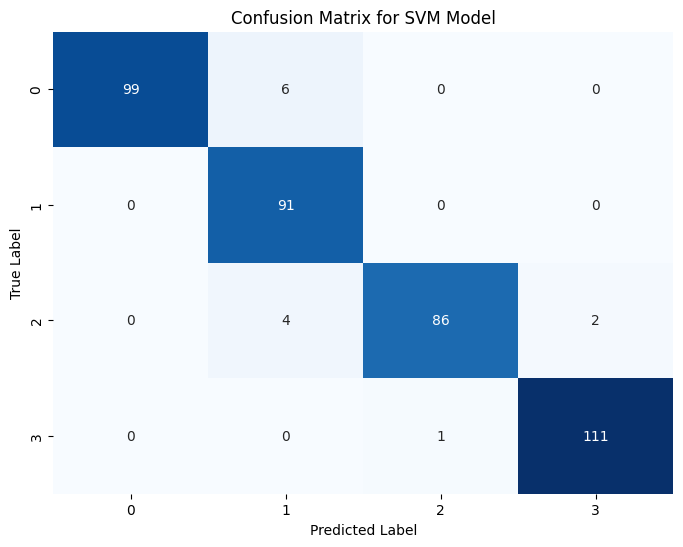

In [39]:
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Initialize the SVM model
svm_model = SVC()

# Define the hyperparameter grid for tuning
param_grid = {
    'C': [0.1, 1, 10, 100],  # Regularization parameter
    'kernel': ['linear', 'rbf', 'poly'],  # Kernel type
    'gamma': ['scale', 'auto', 0.1, 1],  # Kernel coefficient
}

# Create GridSearchCV object with SVM model and hyperparameter grid
grid_search_svm = GridSearchCV(svm_model, param_grid, cv=5, scoring='accuracy')

# Fit the GridSearchCV to the training data
grid_search_svm.fit(X_train, y_train)

# Get the best SVM model from the grid search
best_svm_model = grid_search_svm.best_estimator_

# Predictions on the testing data using the best SVM model
svm_y_pred = best_svm_model.predict(X_test)

# Evaluate the best SVM model
svm_accuracy = accuracy_score(y_test, svm_y_pred)
svm_classification_report_output = classification_report(y_test, svm_y_pred)
conf_matrix = confusion_matrix(y_test, svm_y_pred)

# Display the evaluation metrics for the best SVM model
print(f'Best SVM Accuracy: {svm_accuracy:.2f}')
print('Best SVM Parameters:', grid_search_svm.best_params_)
print('\nBest SVM Classification Report:\n', svm_classification_report_output)

# Display the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False, xticklabels=best_svm_model.classes_, yticklabels=best_svm_model.classes_)
plt.title('Confusion Matrix for SVM Model')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

In [40]:
from sklearn.ensemble import RandomForestClassifier
# taking 300 trees
clsr = RandomForestClassifier(n_estimators=300)
clsr.fit(X_train, y_train)
feature_importance = pd.DataFrame({'Feature':X.columns,
                                   'Score':clsr.feature_importances_}).sort_values(by='Score', ascending=False).reset_index(drop=True)
feature_importance.head()

,Feature,Score
0,ram,0.481641
1,battery_power,0.074457
2,px_height,0.056432
3,px_width,0.056411
4,mobile_wt,0.039641


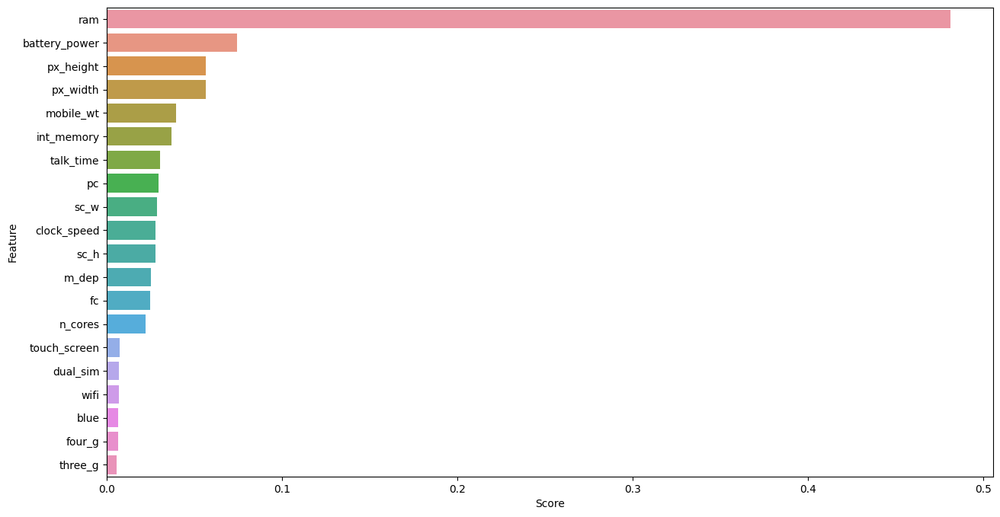

In [41]:
fig, ax = plt.subplots(figsize=(15,8))
ax = sns.barplot(x=feature_importance['Score'], y=feature_importance['Feature'])
plt.show()

# Conclusion
Through extensive exploratory data analysis (EDA), we delved into a dataset encompassing mobile phones categorized into four distinct price ranges. Our analysis unveiled intriguing insights into the factors influencing mobile phone prices and identified key features pivotal for determining the selling price.

# Key Findings:
Price Range Distribution: The dataset exhibited a well-balanced distribution across the four price ranges, indicating a diverse representation of mobile phones across different price categories.

Bluetooth Usage: A notable observation was the 50-50 split in Bluetooth prevalence among mobile phones. This underscores the importance of considering connectivity features in understanding consumer preferences and market demand.

Battery Power Trend: We observed a discernible trend wherein battery power demonstrated a gradual increase with the ascending price range. This correlation highlights the significance of battery performance as a distinguishing factor among mobile phone models.

RAM and Weight Impact: Higher-priced mobile phones were found to boast larger RAM capacities and lighter weights compared to their lower-priced counterparts. This suggests that consumers may attribute value to enhanced performance and portability when making purchasing decisions.

Feature Importance Analysis:
Based on feature importance scores derived from our analysis, we recommend focusing on the following features for determining the selling price:

RAM: The amount of random-access memory (RAM) significantly impacts the performance and multitasking capabilities of mobile phones, influencing their perceived value.

Battery Power: Battery capacity plays a crucial role in determining the usability and endurance of mobile devices, making it a key consideration for consumers.

Pixel Quality (Height and Width): High-resolution displays contribute to enhanced visual experiences and are often associated with premium mobile phone models.

Mobile Weight: Lightweight designs are favored by consumers seeking portability and convenience, making mobile phone weight a crucial determinant of perceived value.

Model Selection and Performance: Our experimentation revealed that the Support Vector Machine (SVM) model with hyperparameter tuning outperformed alternative models, including Logistic Regression and XGBoost. SVM demonstrated superior predictive accuracy, making it the preferred choice for predicting mobile phone prices based on the selected features.

# Summary
Our comprehensive EDA uncovered valuable insights into the mobile phone market landscape, shedding light on consumer preferences and market trends. By focusing on crucial features such as RAM, battery power, and pixel quality, businesses can optimize their product offerings and pricing strategies to cater to evolving consumer demands effectively. Additionally, leveraging advanced machine learning techniques like SVM can enhance price prediction accuracy, enabling businesses to make data-driven decisions and stay competitive in the dynamic mobile phone market.

​
